In [9]:
# import packages and load in dataset
import scanpy as sc
import squidpy as sq
import pandas as pd
from anndata import AnnData
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
sce = sc.read_h5ad("/Users/bp/data/cellular_automata_bio394/JacksonFischer.h5ad")
sce.obs.dtypes

core             category
id                 object
CellNb              int32
Area              float64
Eccentricity      float64
                   ...   
Subtype          category
HR               category
clinical_type    category
response         category
ImageNb             int32
Length: 74, dtype: object

In [46]:
# set spatial array
sce.obsm["spatial"] = np.array([(sce.obs["Location_Center_X"][i],sce.obs["Location_Center_Y"][i]) for i in range(len(sce.obs["Location_Center_X"]))])

# set metacluster to categorical
sce.obs["metacluster"] = sce.obs["metacluster"].astype("category")

# set ImageNb to categorical
sce.obs["ImageNb"] = sce.obs["ImageNb"].astype("category")

In [67]:
colors = cm.get_cmap("viridis",27)
sce.uns["metacluster_colors"] = colors.colors

In [68]:
sq.gr.spatial_neighbors(sce,n_neighs=8,coord_type="generic",library_key="ImageNb")
sq.gr.centrality_scores(
    sce,
    cluster_key="metacluster")


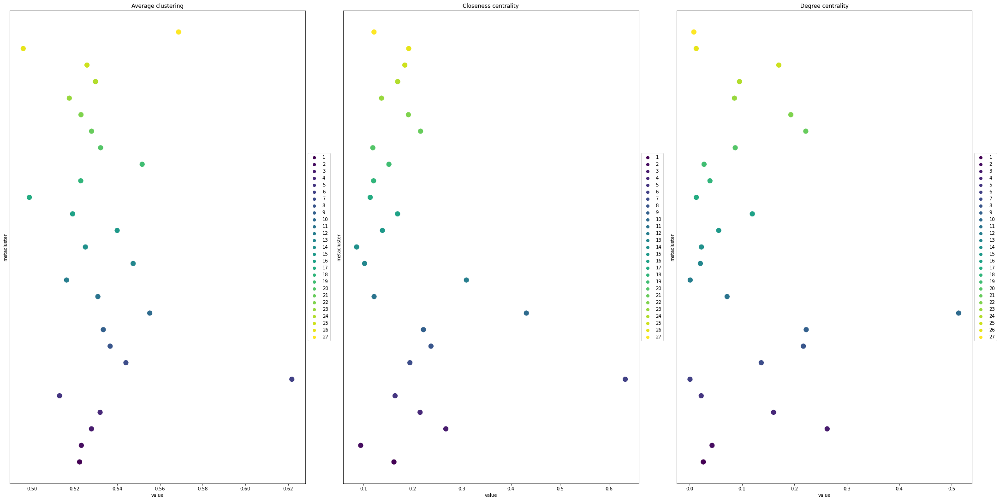

In [76]:
sq.pl.centrality_scores(sce, cluster_key="metacluster",figsize=(30,15),s=150)

ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unabl

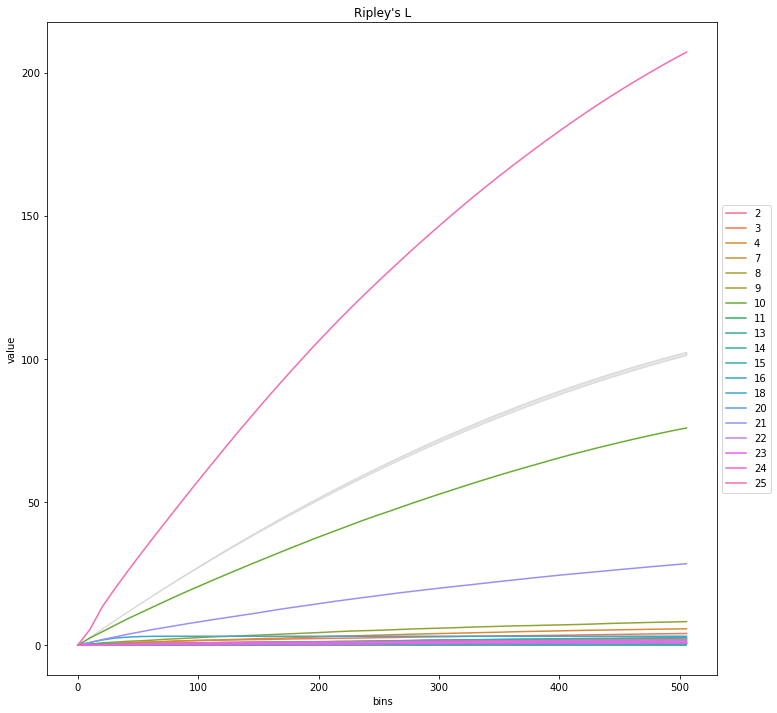

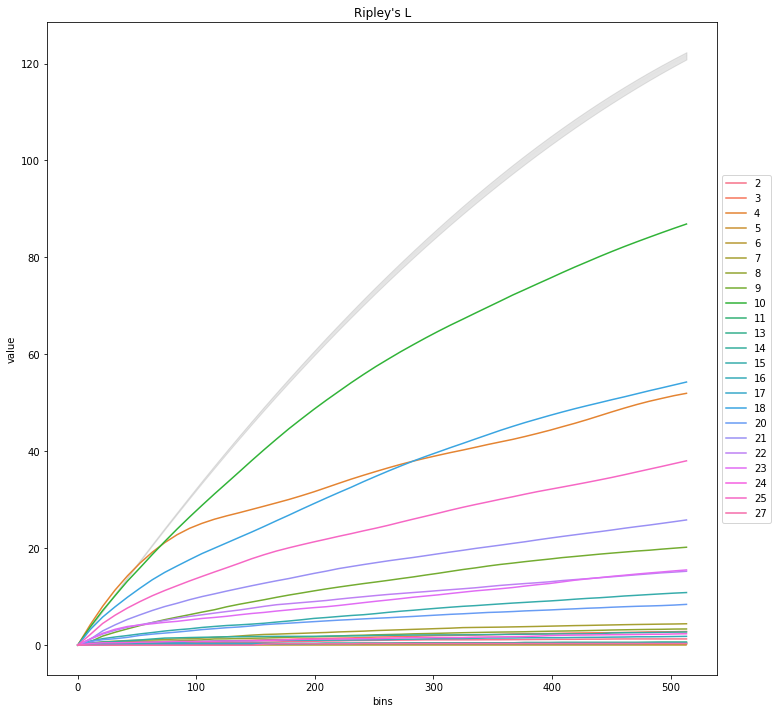

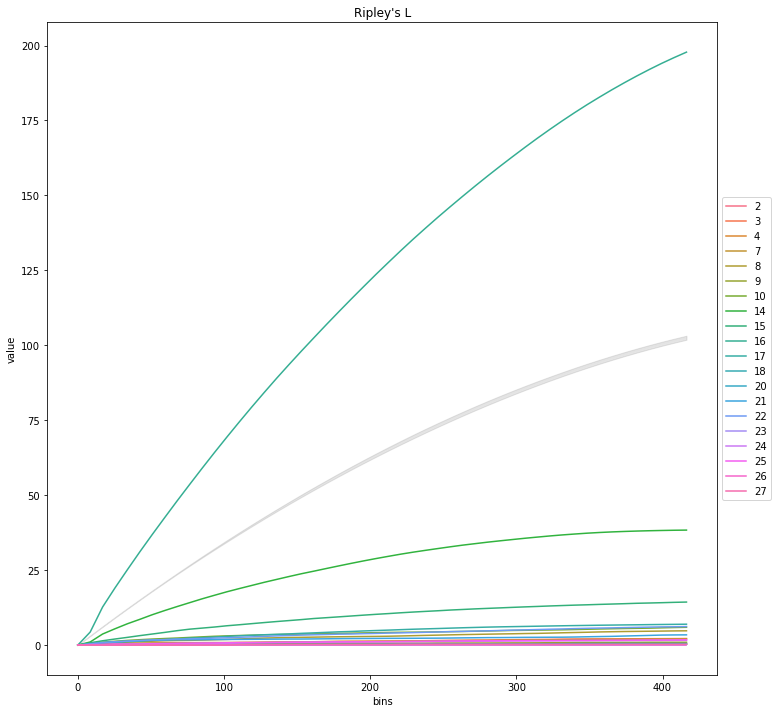

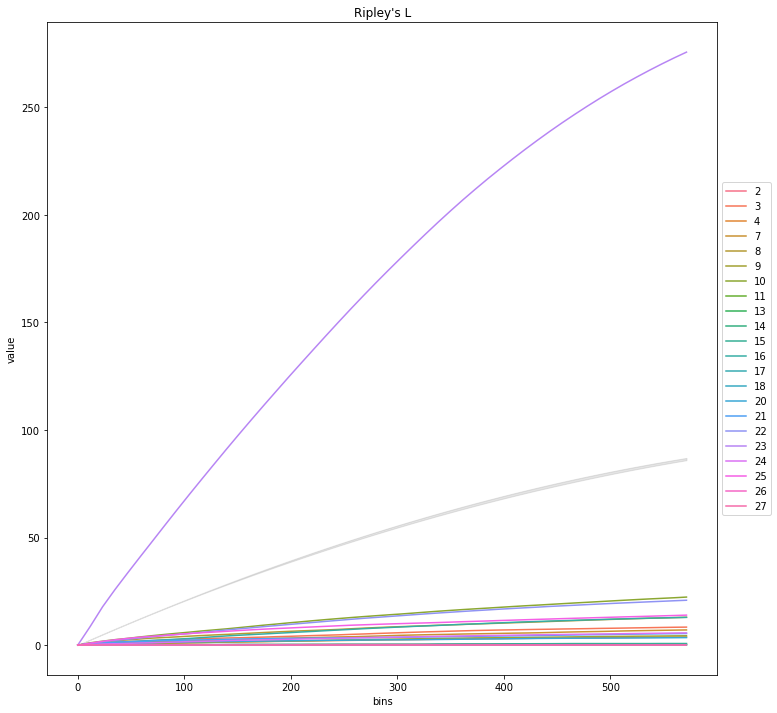

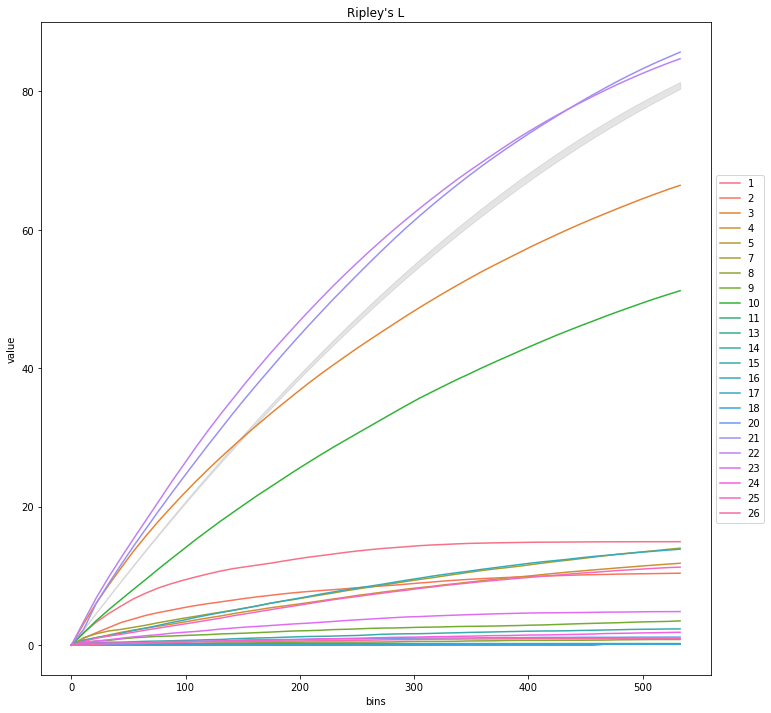

...

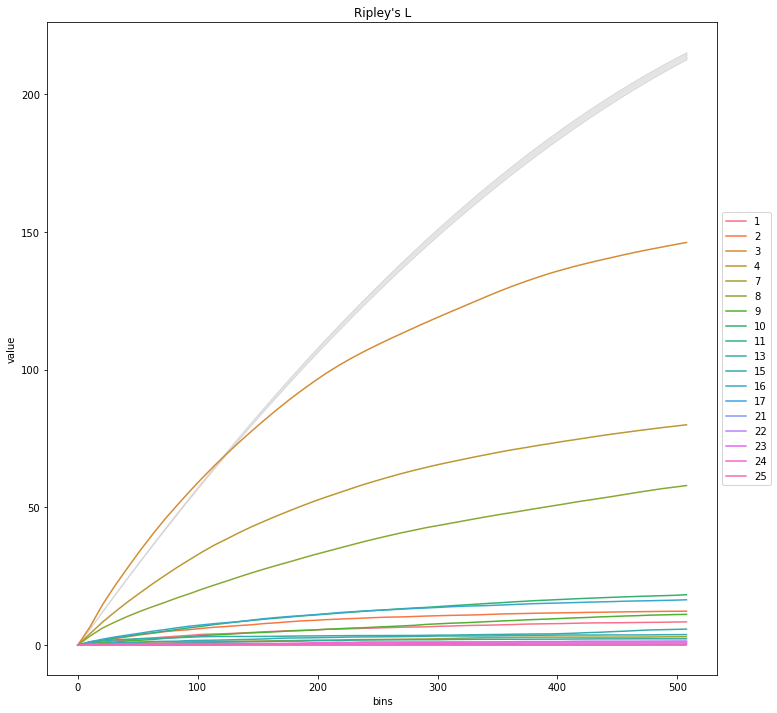

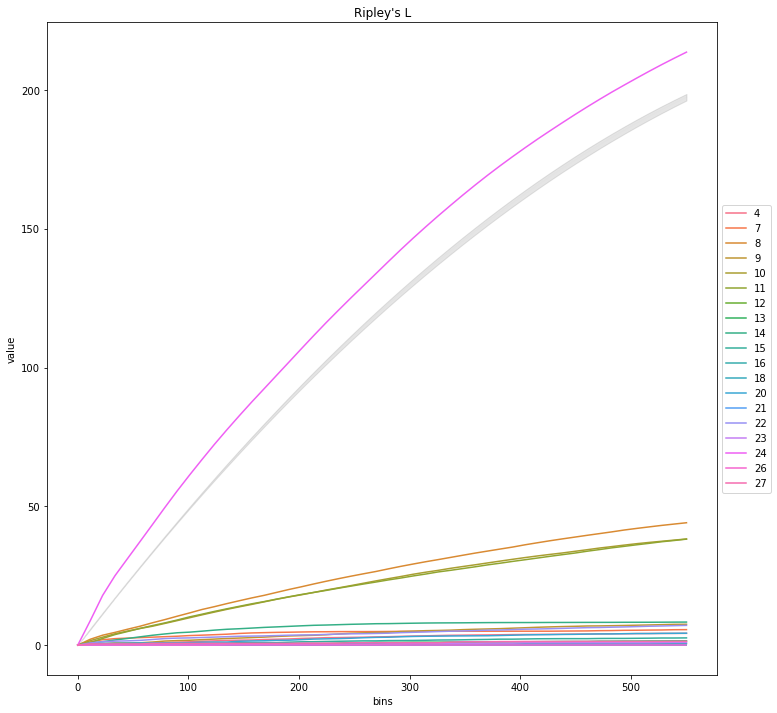

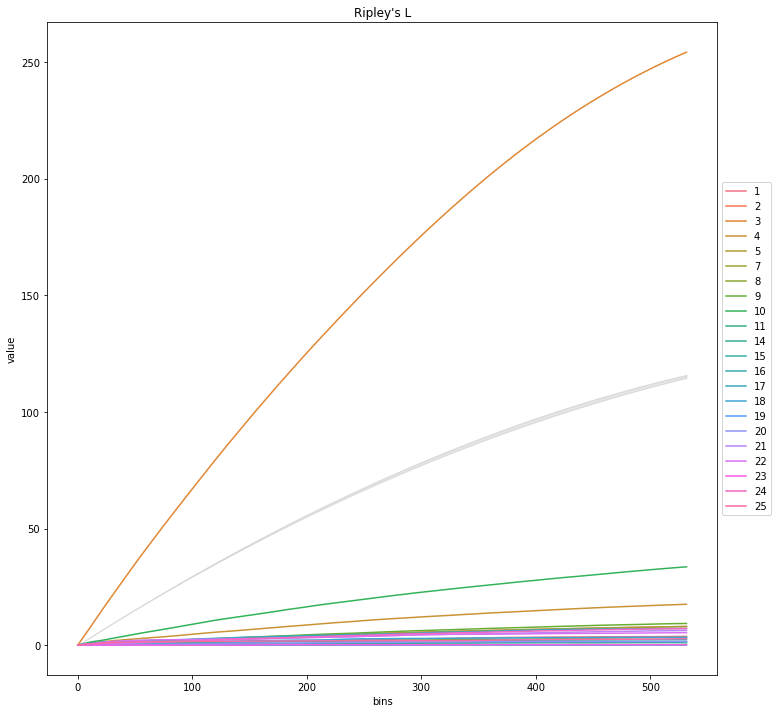

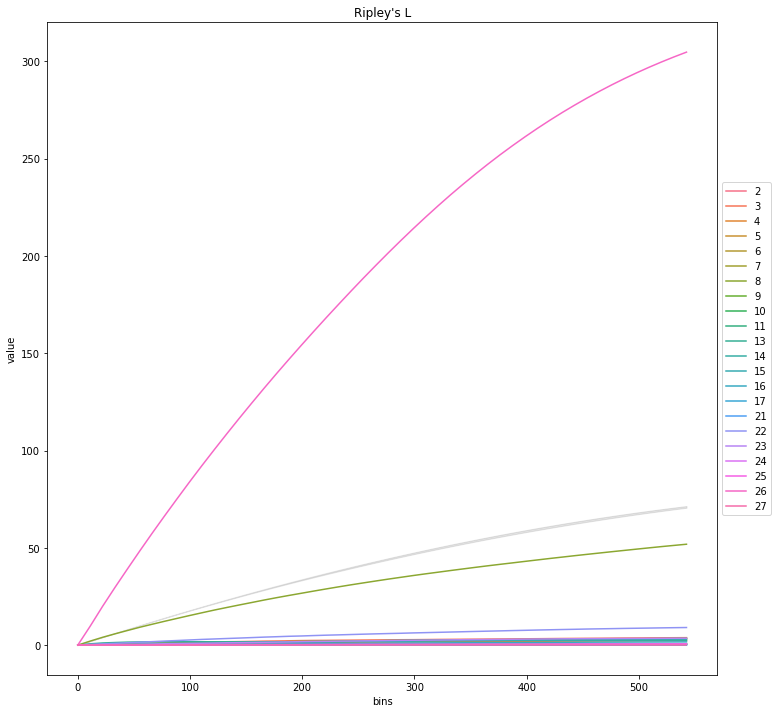

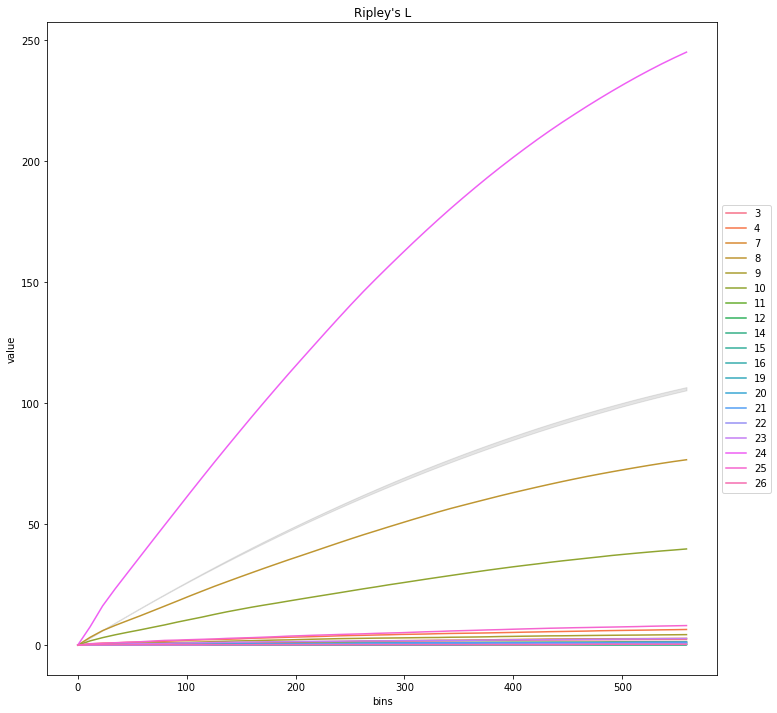

In [42]:
import warnings
warnings.filterwarnings('ignore')
# subset to one image and compute ripleys function

for i in sce.obs["ImageNb"].unique():
    # take single image
    one_image = sce[sce.obs["ImageNb"] == i]
    sq.gr.ripley(one_image, cluster_key="metacluster", mode="L")
    a = sq.pl.ripley(one_image, cluster_key="metacluster", mode="L",figsize=(12,12))

ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.


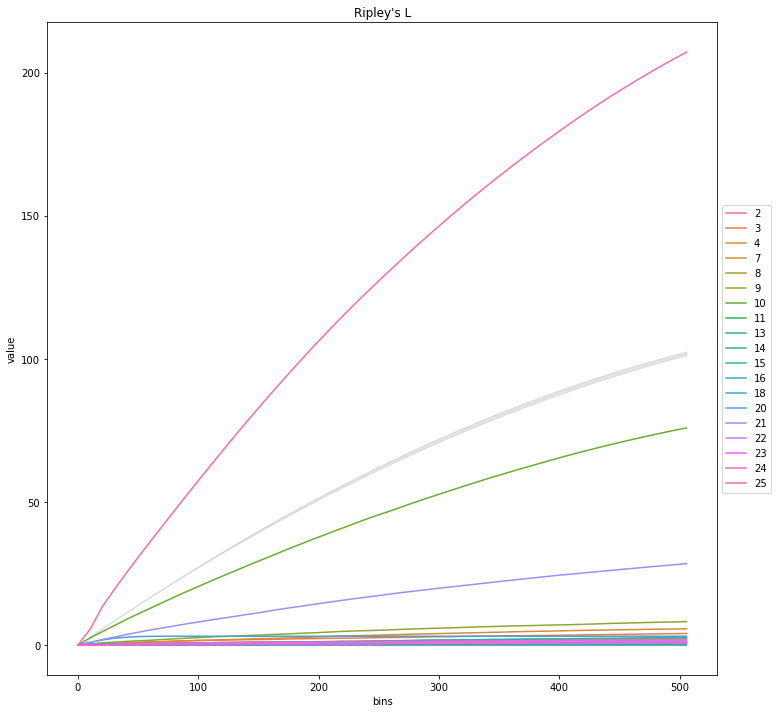

In [21]:
sq.gr.ripley(one_image, cluster_key="metacluster", mode="L")
a = sq.pl.ripley(one_image, cluster_key="metacluster", mode="L",figsize=(12,12))

ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.


/opt/homebrew/anaconda3/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


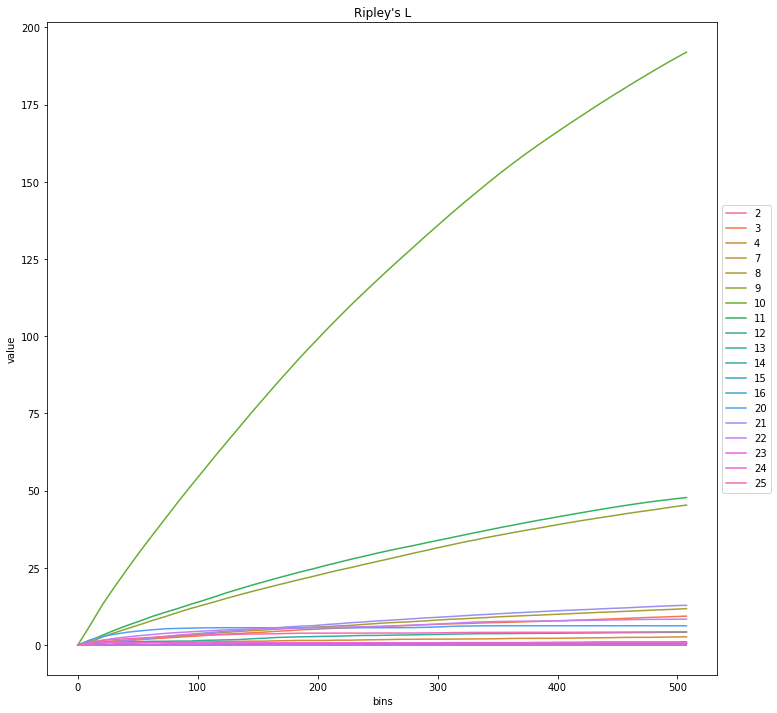

In [23]:
one_image = sce[sce.obs["ImageNb"] == 30]
sq.gr.ripley(one_image, cluster_key="metacluster", mode="L")
a = sq.pl.ripley(one_image, cluster_key="metacluster", mode="L",figsize=(12,12),plot_sims=False)

In [27]:
sq.gr.co_occurrence(one_image,cluster_key="metacluster",show_progress_bar=False)

ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unable to fetch palette, reason: 'metacluster_colors'. Using `None`.
ERROR: Unabl

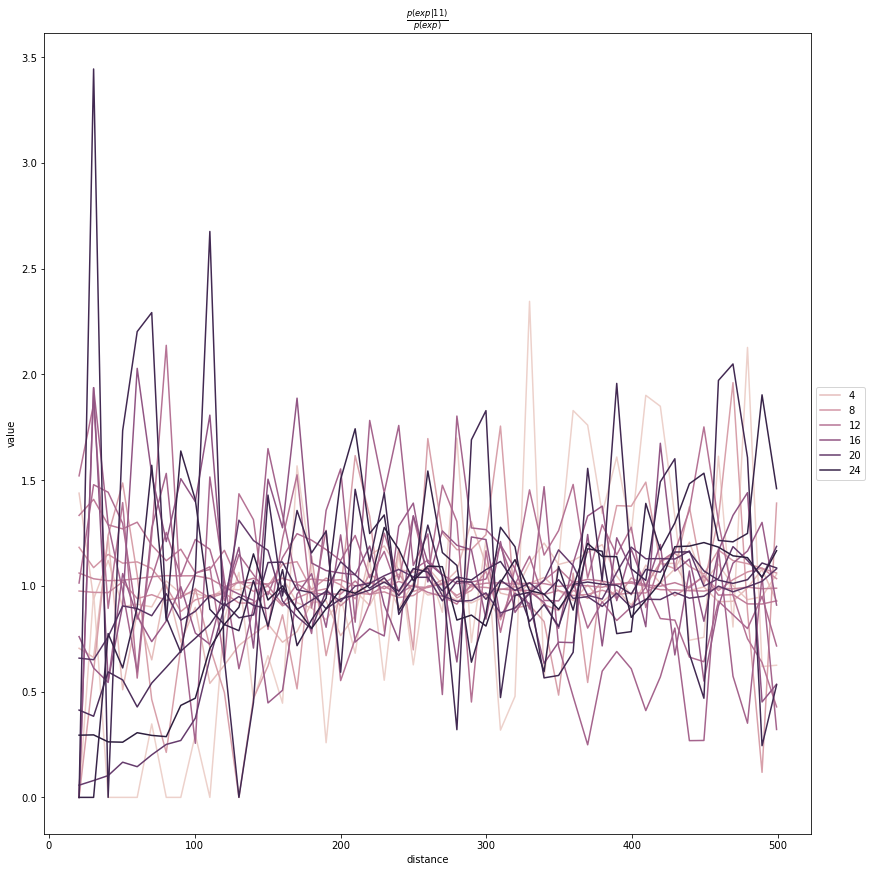

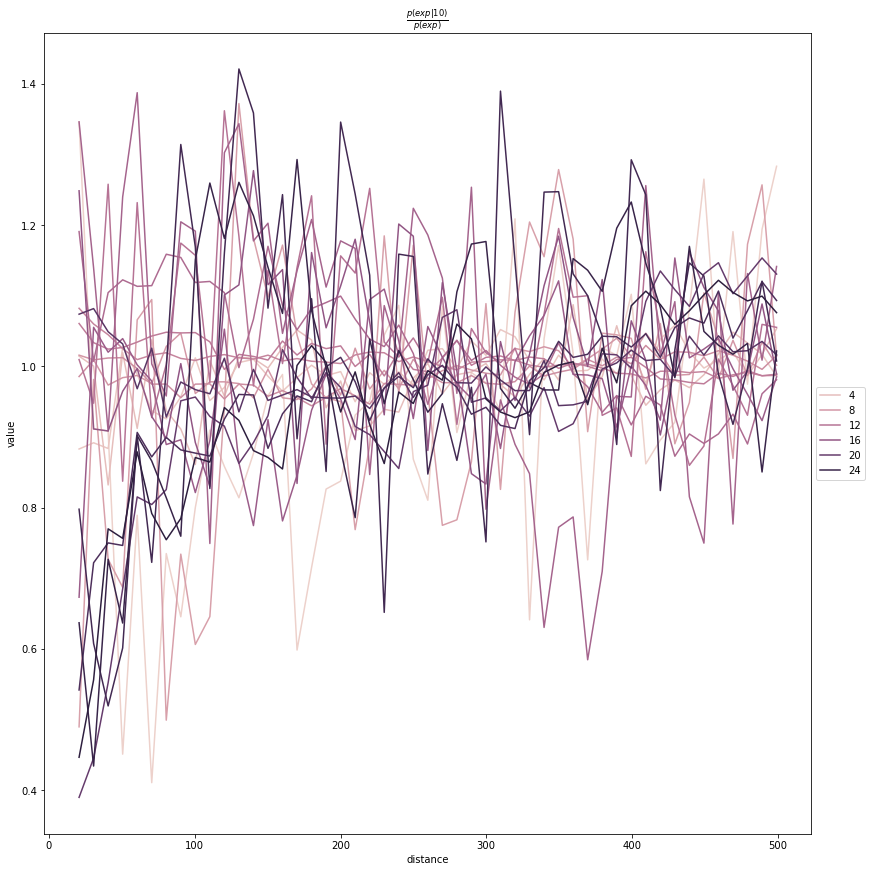

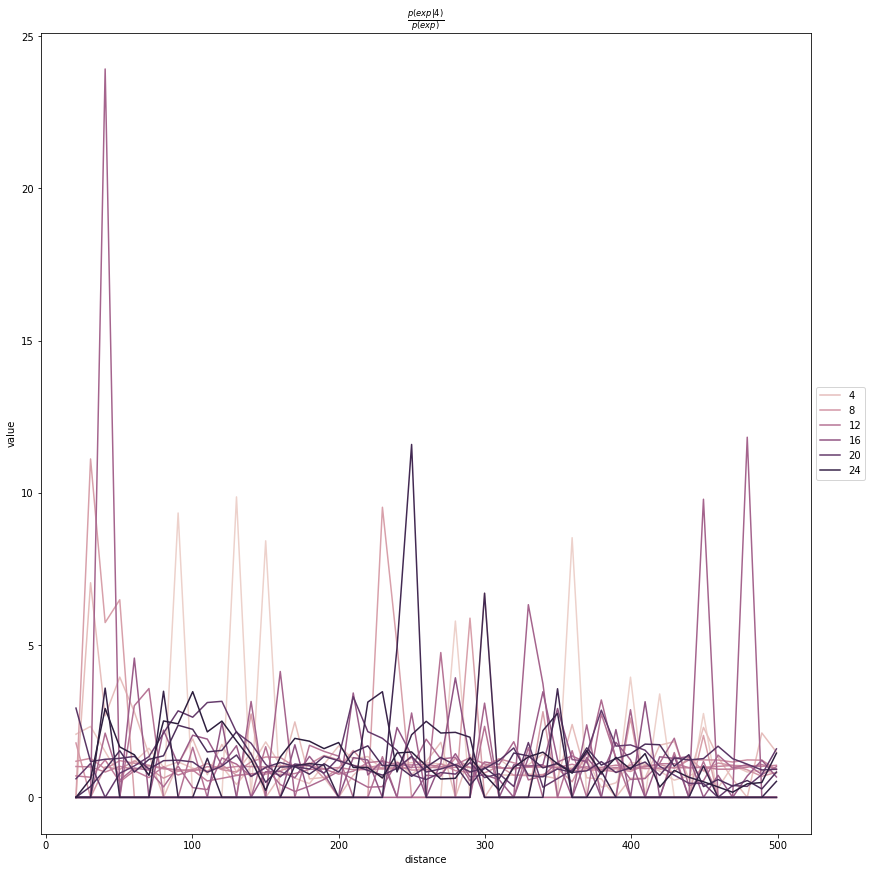

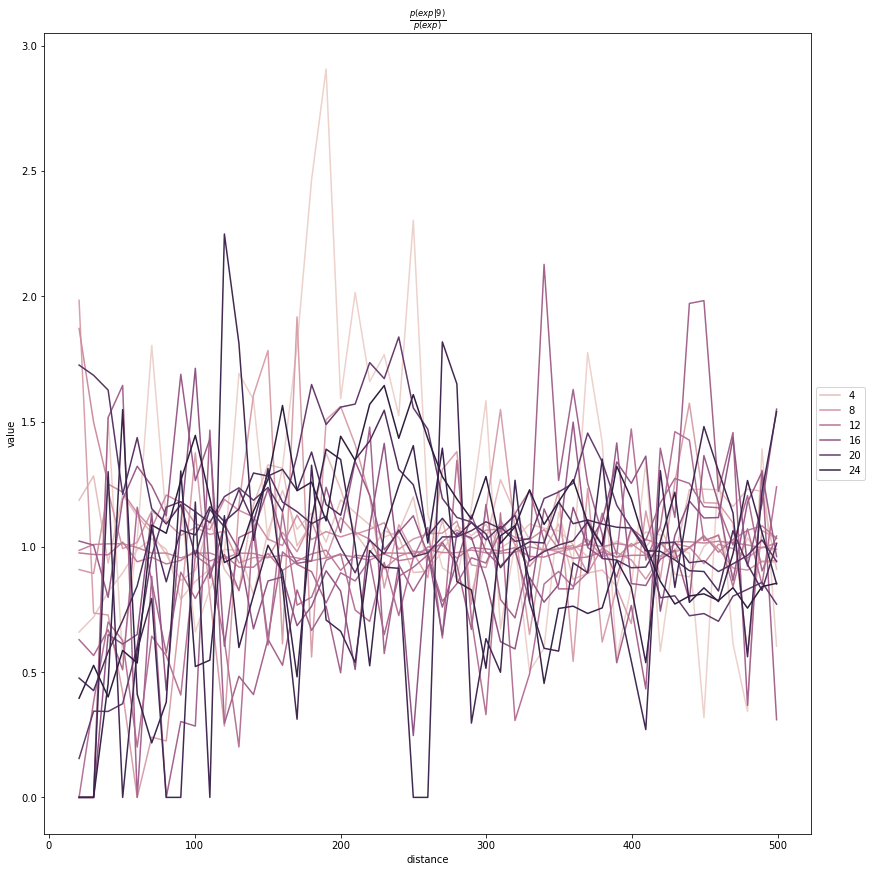

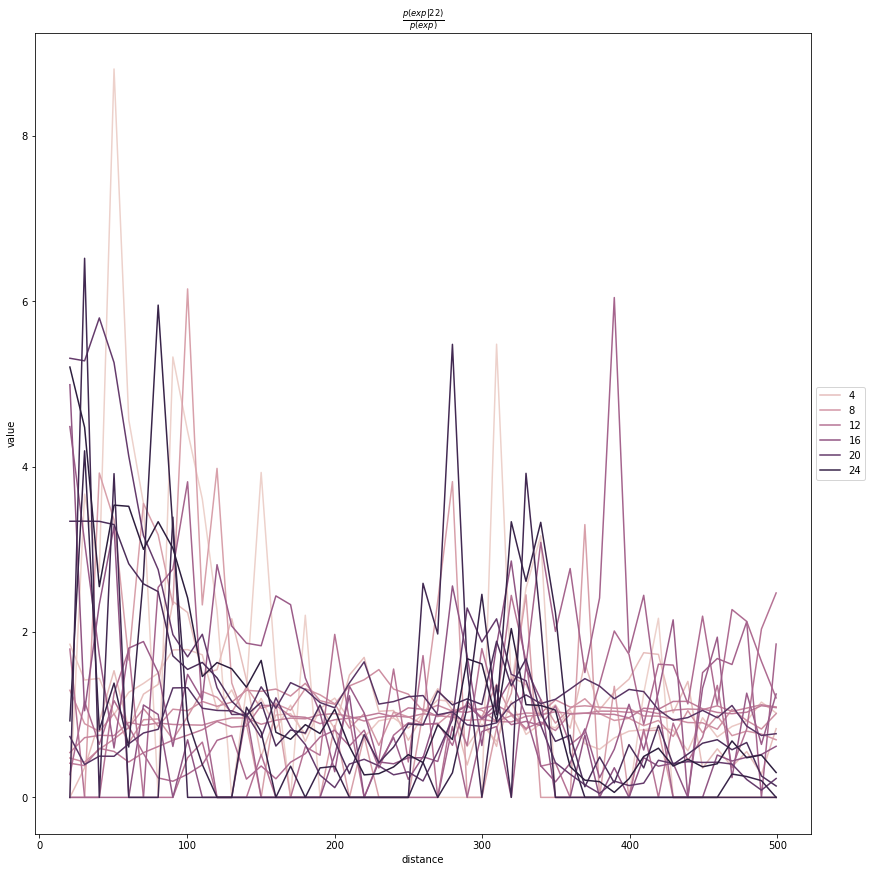

...

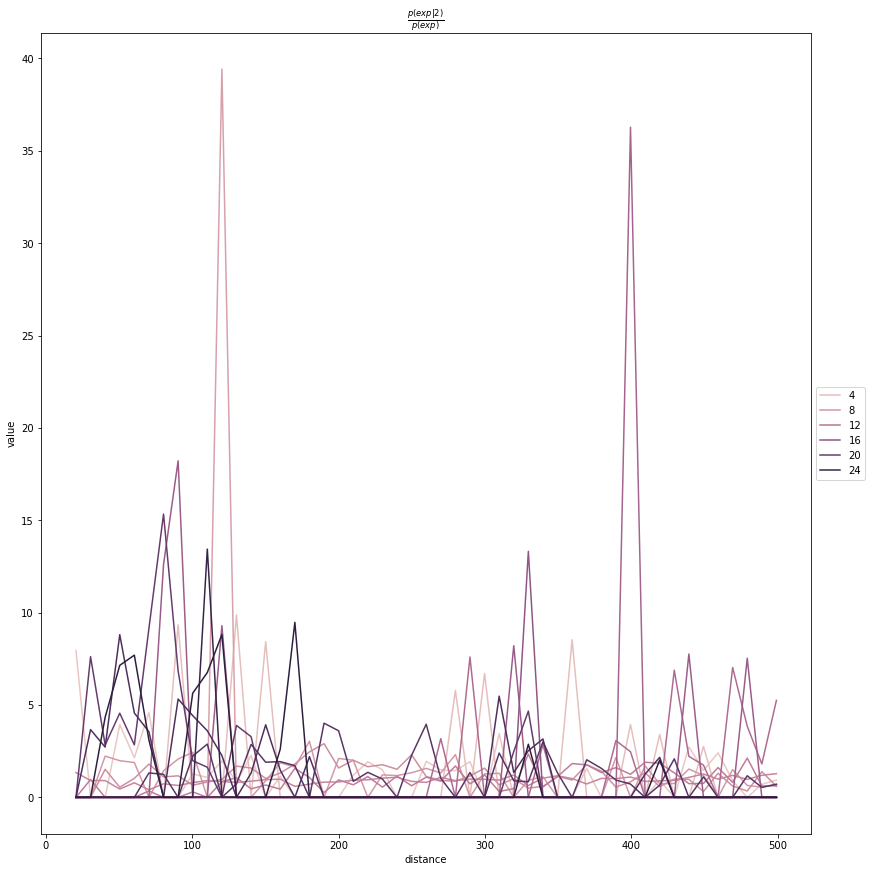

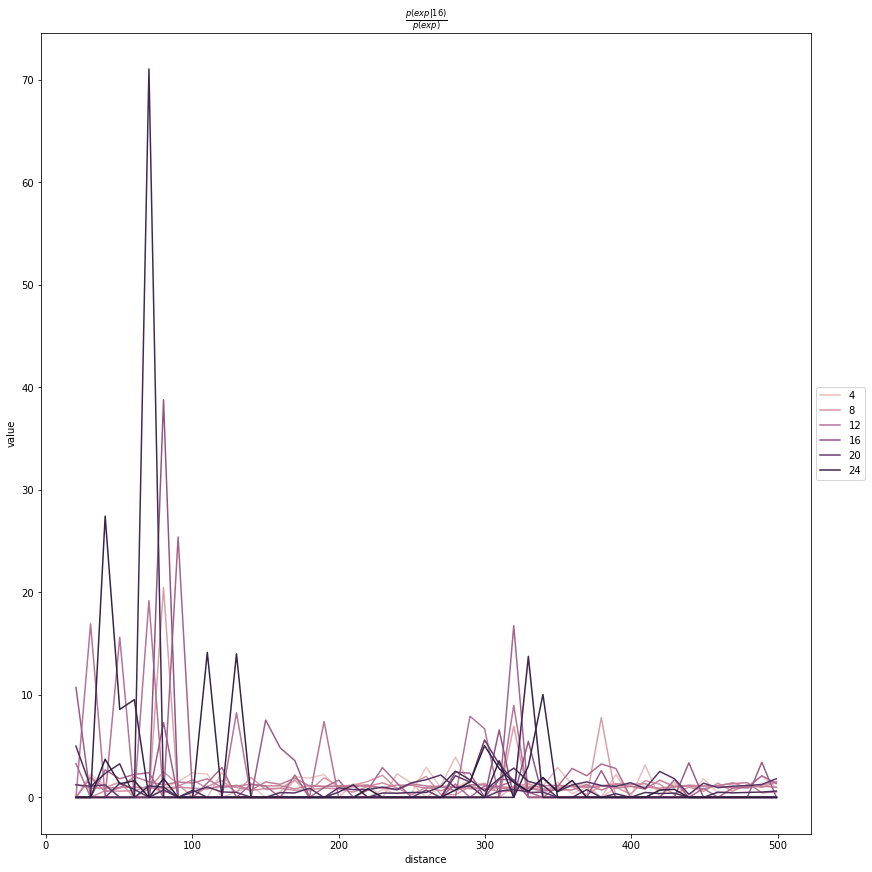

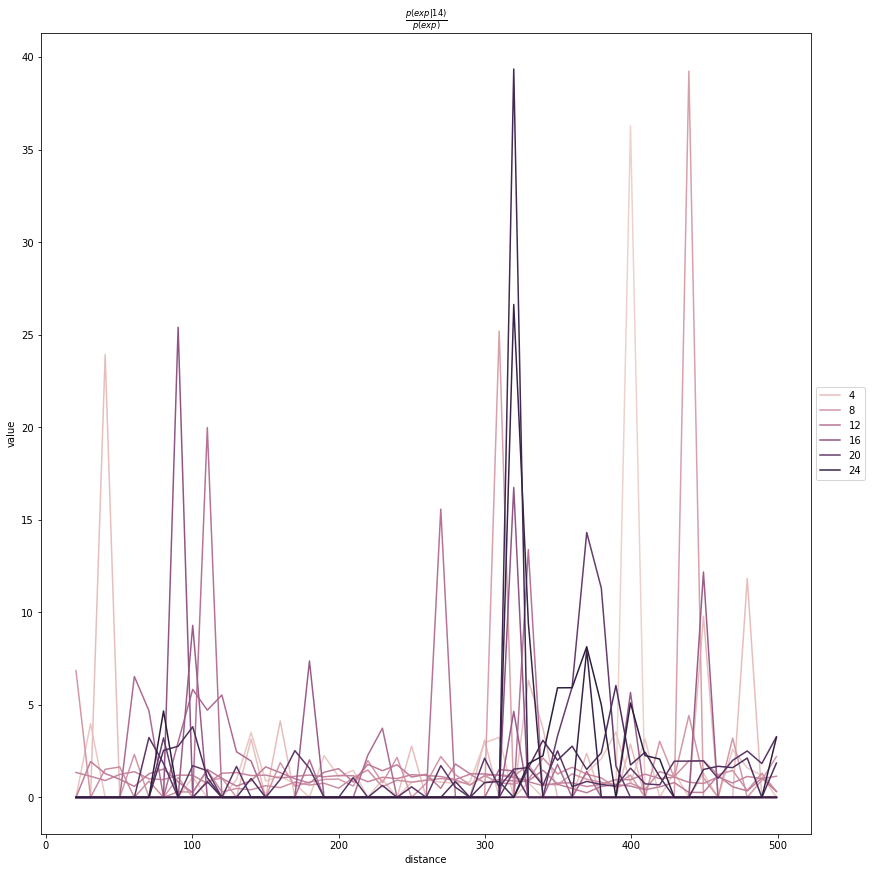

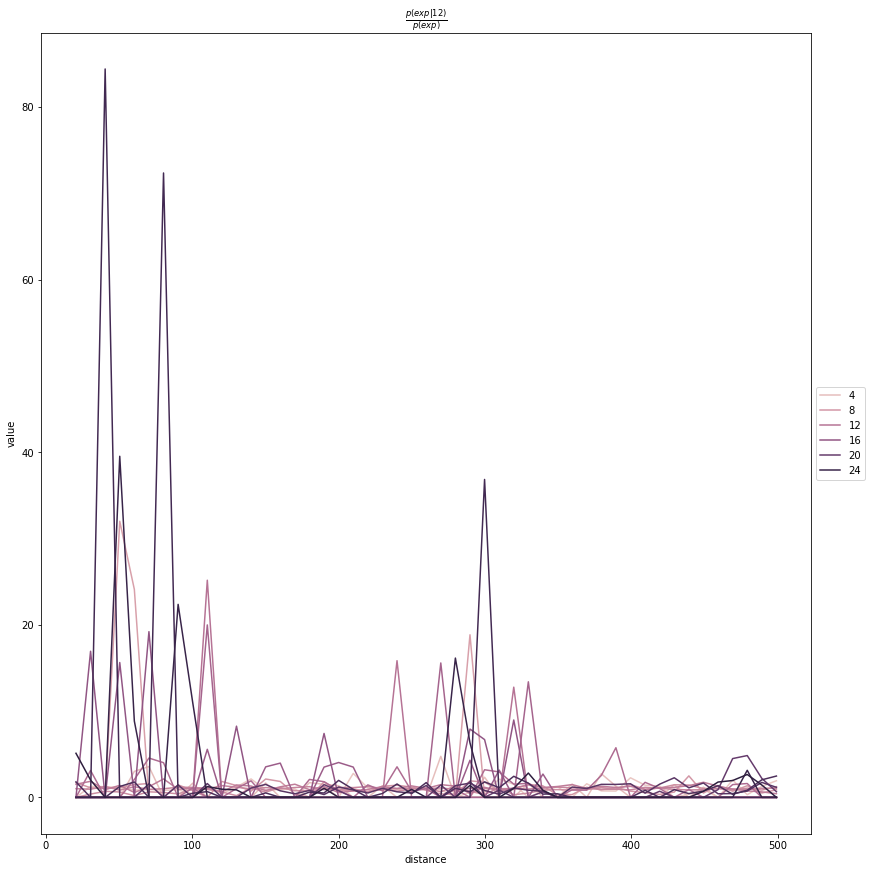

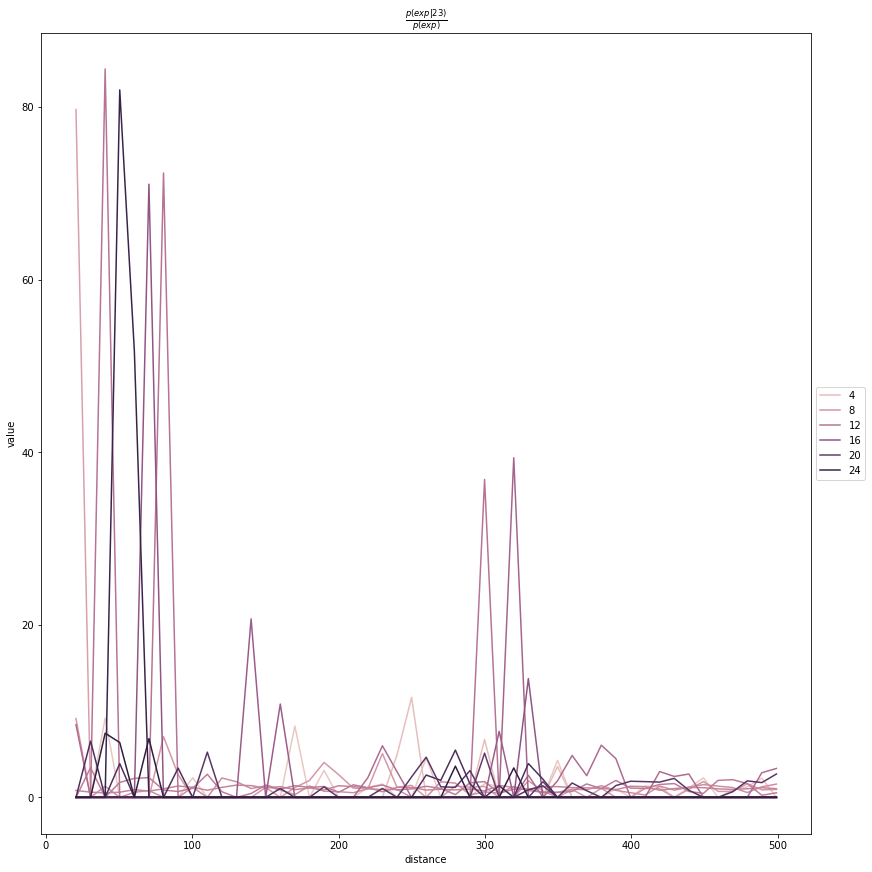

In [40]:
for i in one_image.obs["metacluster"].unique():
    sq.pl.co_occurrence(one_image,cluster_key="metacluster",clusters=[i],figsize=(12,12))